# Indigenous knowledge networks in the face of global change
Autor tarea: Alen Figueroa

## Objetivos del paper
- Formular y analizar una red de conocimientos de comunidades nativas de latinoamética.
- Determinar los componentes críticos de la red.

<span style="color:red"> 

- Te recomiendo explicar un poco más en detalle qué es lo que pretende el paper. Sirve imaginar que el que lee el notebook no conoce (tanto) el paper. De esta forma, se entiende mejor por qué se utilizaron redes bipartitas. ¿A qué se refiere la red de conocimientos?
- Falta mencionar muy brevemente (y de manera simple) qué es un grafo bipartito. Luego, puedes mostrar cómo se aplica  a este caso particular.
- Sería super útil que aparte de contar sobre el paper, introduzcas qué vas a hacer en la tarea. ¿Qué son los componentes críticos? ¿Por qué eso es importante?

</span>

In [2]:
import networkx as nx
from networkx.algorithms import bipartite 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pylab
import math

# Para imprimir tablas formateadas
!pip install tabulate
!pip install networkx


## Construcción de la red

Para construir la red, se utiliza un dataset que contiene en cada fila una comunidad, una planta y el uso que le da la comunidad a esta.
En este dataset se contienen:
- 57 comunidades
- 120 plantas
- 243 servicios
Este conocimiento lo obtuvieron mediante entrevistas presenciales, tanto a los expertos como a la gente común de cada comunidad. A partir de estas entrevistas, se generaron relaciones entre plantas y servicios, los cuales son creados a partir de la parte de la planta que se utiliza, la categoría y la sub categoría del uso.

<span style="color:red"> 

- Aquí sería ideal utilizar conceptos de grafos bipartitos, y señalar qué significan en este caso cada conjunto.
- Falta explicar más claramente cómo se construyen las redes. 
- Fíjate que acá mencionas algunos números y después también. Mejor que queden en un solo lado. 

</span>

In [75]:
df = pd.read_csv("./datos-networks.csv")
df.head()


,Community,Plant_species,Plant_service
0,Zabalo,Aiphanes ulei,Stem_Utensils & tools_Hunting and fishing
1,Zabalo,Astrocaryum chambira,Fruit_Cultural_Personal adornment
2,Zabalo,Astrocaryum chambira,Seed_Human food_Food
3,Zabalo,Astrocaryum chambira,Spear leaf_Cultural_Clothes and accessories
4,Zabalo,Astrocaryum chambira,Spear leaf_Cultural_Personal adornment


Cada comunidad conoce unas determinadas plantas, las cuales tienen uno o más usos.

<span style="color:red"> 

- Esta idea es interesante, pero debes explicar más claramente. 

</span>

A partir de esto, se crean grafos bipartitos para cada una de las comunidades, con por un lado las plantas y por otro los usos que se le dan.

<span style="color:red"> 

- Sé más preciso en cómo construyes las redes bipartitas. 
</span>

In [164]:
# separamos los usos que se le pueden dar
servicios = df['Plant_service'].unique().tolist()

# Separamos las plantas existentes
plantas = df['Plant_species'].unique().tolist()

# Separamos las comunidades existentes
comunidades = df['Community'].unique().tolist()

# Imprimimos para describir el dataset
print(len(comunidades), '  comunidades')
print(len(plantas), ' plantas')
print(len(servicios), ' servicios')

57   comunidades
120  plantas
243  servicios


### Redes bipartitas
Para la resolución de la tarea, se deben crear redes bipartitas por cada comunidad. La siguiente función hará el trabajo de construir una red a partir del dataset inicial y la comunidad a utilizar.

<span style="color:red"> 

- El lector no sabe cómo va sa hacer las redes, eso puede ser un poco confuso.  

</span>

In [77]:
def grafo_bipartito(df : pd.DataFrame, comunidad : str):
    
    # Se filtra el DataFrame con una comunidad específica
    df_list = [fila for fila in zip(df['Community'], df['Plant_species'], df['Plant_service']) if fila[0] == comunidad]
    
    df2 = pd.DataFrame(df_list, columns=['Community', 'Plant_species', 'Plant_service'])
    
    # Se extrae una lista única de plantas y servicios
    servicios = df2['Plant_service'].unique().tolist()
    plantas = df2['Plant_species'].unique().tolist()

    # Se crea una red bipartita y se agregan los nodos a las dos secciones de la red
    G = nx.Graph()

    G.add_nodes_from(plantas, bipartite=0)
    G.add_nodes_from(servicios, bipartite=1)


    # Se agregan las conexiones de la red.
    #   Primero, se genera una lista de pares ordenados, 
    #     que representarán las conexiones entre plantas y servicios
    filas = [ (filas[0], filas[1]) for filas in zip(df2['Plant_species'], df2['Plant_service']) ]
    G.add_edges_from(filas)
    
    return G



In [79]:
# Se crea un diccionario para almacenar las redes bipartitas de todas las comunidades.
redes = {}
for comunidad in comunidades:
    red = grafo_bipartito(df, comunidad)
    redes[comunidad] = red



<span style="color:red"> 

- Toda esta parte requiere más explicación. 

</span>

In [168]:
def datos_red(red):
    #nodos, aristas, componentes, grado y número de componentes conexas
    nodos = len(red.nodes)
    aristas = len(red.edges)
    componentes = nx.algorithms.components.number_connected_components(red)
    densidad = round(bipartite.density(red, {n for n, d in red.nodes(data=True) if d["bipartite"] == 1}), 2)
    plantas = {n for n, d in red.nodes(data=True) if d["bipartite"] == 0}
    servicios = {n for n, d in red.nodes(data=True) if d["bipartite"] == 1}
    return [nodos, len(plantas), len(servicios), aristas, componentes, densidad]

# Recorremos las redes para guardar las métricas escogidas
metricas = []
for red in redes:
    metricas.append(datos_red(redes[red]))

# Estructuras para la determinación del máximo, mínimo y promedio de cada métrica
max = [-math.inf] * 6
min = [math.inf] * 6
prom = [0] * 6


# Obtenemos el máximo, mínimo y el promedio de las métricas
for metrica in metricas:
    for i in range(len(max)):
        if max[i] < metrica[i]:
            max[i] = metrica[i]

        if min[i] > metrica[i]:
            min[i] = metrica[i]

        prom[i] = prom[i] + metrica[i]

for i in range(len(prom)):
    prom[i] = round(prom[i] / len(redes), 2)

## Determinamos la forma de las redes

<span style="color:red"> 

- ojo con la palabra "forma"

</span>

Se utilizan métricas como el número de nodos, aristas y componentes conexas, para describir las formas de estas redes.
Se puede apreciar que se contiene una cantidad baja de componentes conexas, y esto se puede deber a la naturaleza de las redes bipartidas, además de que las plantas tienden a tener más de un uso, por lo que la mayoría de las rede son completas.

<span style="color:red"> 

- Explica más claramente qué quieres hacer en esta sección y luego qué encontraste en los resultados. 

</span>

In [169]:
from IPython.display import HTML, display
import tabulate

tabla = [
        ['máximo'] + max,
        ['mínimo'] + min,
        ['prom'] + prom]
display(HTML(tabulate.tabulate(tabla, tablefmt='html', stralign='center', headers=['','# de nodos', '# de plantas', '# de servicios',  '# de aristas', '# de componentes', 'densidad'])))

,# de nodos,# de plantas,# de servicios,# de aristas,# de componentes,densidad
máximo,132,40,93,308,6,0.29
mínimo,20,6,12,14,1,0.08
prom,52.56,17.28,35.28,94.58,1.82,0.16


In [174]:
# Se determina la red con mayores nodos, para su utilización en el resto de la tarea.
max = -1
nombre = ''
for red in redes:
    nNodos = redes[red].number_of_nodes()
    if nNodos >= max:
        max = nNodos
        nombre = red

print('La comunidad con mayor cantidad de nodos es "', nombre, '" con ', max, ' nodos')

G = redes[nombre]

La comunidad con mayor cantidad de nodos es " San Martin de Amacayacu " con  132  nodos


## Redes Proyectadas
Obtenemos las redes proyectadas de la comunidad con más nodos, en este caso es 'San Martin de Amacayu'.

<span style="color:red"> 

- Deberías explicar brevemente la noción de redes proyectadas. 
- ¿Por qué es importante hacer esto? ¿Qué cosas pueden verse?

</span>

In [96]:
X, Y = bipartite.sets(G)
plantas_proyectadas = bipartite.projected_graph(G, X)
servicios_proyectados = bipartite.projected_graph(G, Y)


## Métricas de Centralidad
A partir de las redes proyectadas, utilizaré 3 métricas de centralidad: Grado, Vector Propio y centralidad armónica

<span style="color:red"> 

- ¿Por qué estas medidas?
- ¿Qué pretendes ver con esto?

</span>

In [98]:
def centralidades(G, method, cant, name):
    data_frame = pd.DataFrame(sorted(method(G).items(), key=lambda item: item[1],reverse=True))

    data_frame.columns = [name , 'Centralidad']
    datos = data_frame.head(cant)
    return datos 

def agrupar_centralidades(G, name):
    dfs = []
    metodos = [nx.degree_centrality, nx.eigenvector_centrality, nx.harmonic_centrality]
    for metodo in metodos:
        df = centralidades(G=G, method=metodo, cant=5, name=name)
        dfs.append(df)

    return pd.concat(dfs, keys=[metodo.__name__ for metodo in metodos])


In [99]:
agrupar_centralidades(plantas_proyectadas, 'Planta')

Planta  Centralidad
degree_centrality      0      Euterpe precatoria     1.000000
                       1      Mauritiella armata     1.000000
                       2       Oenocarpus mapora     1.000000
                       3    Bactris brongniartii     0.973684
                       4  Chamaedorea pauciflora     0.973684
eigenvector_centrality 0      Euterpe precatoria     0.180214
                       1      Mauritiella armata     0.180214
                       2       Oenocarpus mapora     0.180214
                       3       Oenocarpus bataua     0.177876
                       4          Bactris bifida     0.177876
harmonic_centrality    0      Euterpe precatoria    38.000000
                       1      Mauritiella armata    38.000000
                       2       Oenocarpus mapora    38.000000
                       3    Bactris brongniartii    37.500000
                       4  Chamaedorea pauciflora    37.500000

Lo que podemos ver a partir de estos resultados, es que si bien el puntaje cambia, los nodos con mejor centralidad de plantas coinciden con los mejores del gráfico S3, donde se cuantifica la importancia entre un uso y un servicio con el número de comunidades que reconocen ese enlace, lo que denota que la comunidad es clave para la conservación de la herencia del conocimiento. Esto es porque contibuyen a la metared consiguiendo muchas plantas para los mismos usos.

<span style="color:red"> 

- La idea es interesante pero debes explicar mejor. Revisa la redacción.
- Hay errores de tipeo y de ortografía.
- Ojo con los términs que usas. 

</span>

In [100]:
agrupar_centralidades(servicios_proyectados, 'Servicio')

Servicio  Centralidad
degree_centrality      0   Entire leaf_Construction_Thatch     0.902174
                       1  Seed_Cultural_Personal adornment     0.815217
                       2          Stem_Other_Miscellaneous     0.804348
                       3             Fruit_Human food_Food     0.760870
                       4          Stem_Construction_Houses     0.619565
eigenvector_centrality 0   Entire leaf_Construction_Thatch     0.247445
                       1          Stem_Other_Miscellaneous     0.240097
                       2  Seed_Cultural_Personal adornment     0.227291
                       3             Fruit_Human food_Food     0.225012
                       4        Fruit_Human food_Beverages     0.199025
harmonic_centrality    0   Entire leaf_Construction_Thatch    87.500000
                       1  Seed_Cultural_Personal adornment    83.500000
                       2          Stem_Other_Miscellaneous    83.000000
                       3             Fruit_Human food_Food    81.000000
                       4          Stem_Construction_Houses    74.500000

Por otro lado, la centralidad de los servicios no coincide demasiado. De esto podría interpretarse en que, si bien tienen usos variados, estos no son los más representativos del conocimiento de todas las comunidades, por lo que deben ser conservados para mantener una mayor parte de la herencia cultural.

<span style="color:red"> 

- Sé más preciso en tus observaciones. No queda bien usar "demasiado". 

</span>

## Redes Visualizadas

Ahora se procederán a mostrar en un gráfico las redes proyectadas. Se hace en un tamaño considerable debido a la gran conectividad de estas redes, lo que dificulta su visualización. Se puede apreciar de que las red proyectada de servicios tiene mayor diferencia en la cantidad de conexiones que la red de plantas.

<span style="color:red"> 

- Revisa tu redacción. Trata de explicar mejor las ideas. 

</span>

39


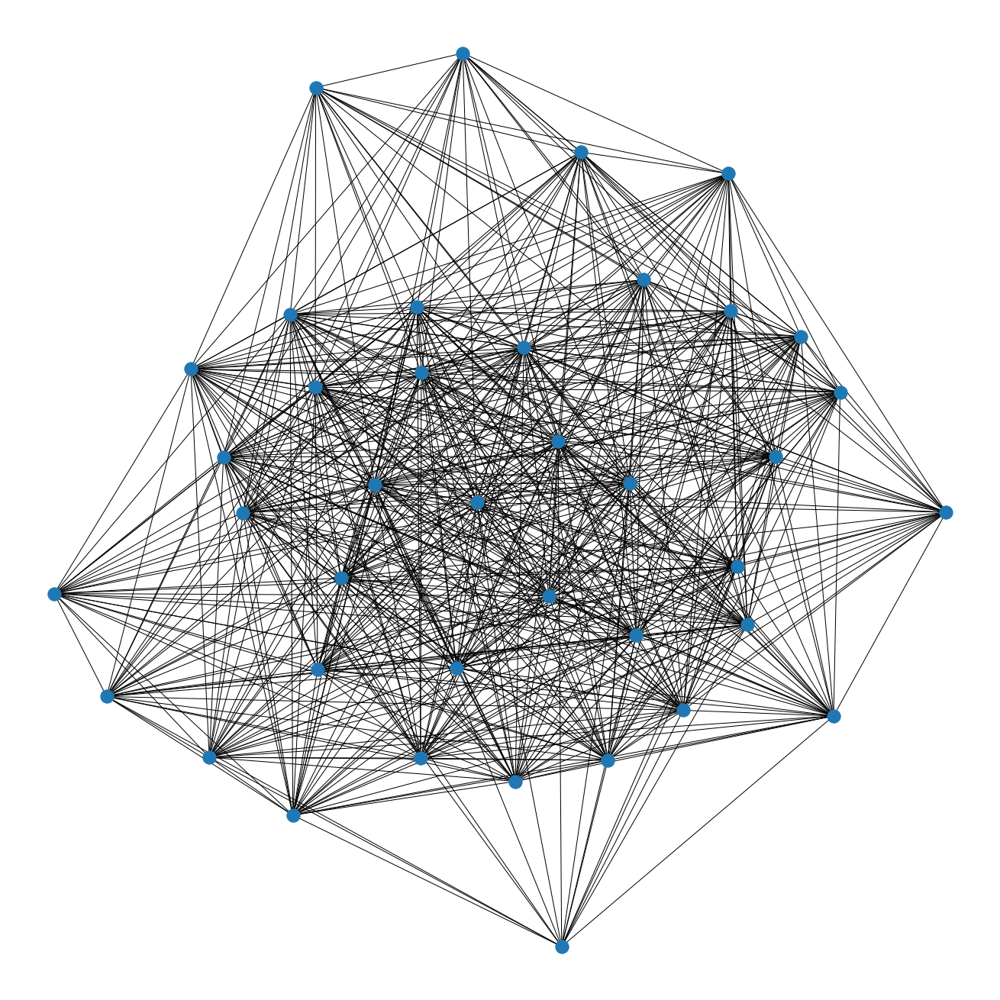

In [175]:

import matplotlib.pyplot as plt
plt.figure(3,figsize=(18,18)) 
pos = nx.kamada_kawai_layout(plantas_proyectadas)
nx.draw(plantas_proyectadas,pos)
print(len(plantas_proyectadas.nodes()))
plt.savefig('proyectada_plantas.pdf')

93


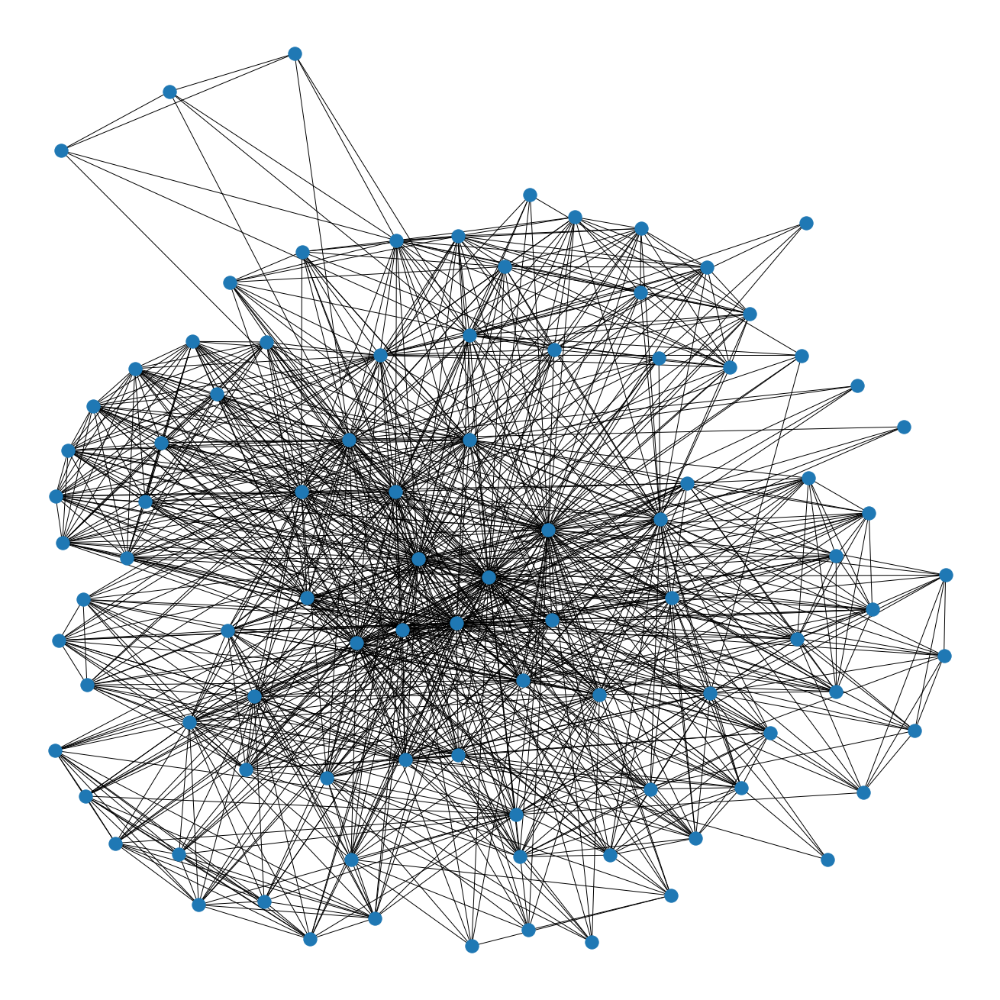

In [176]:
import matplotlib.pyplot as plt
plt.figure(3,figsize=(18,18)) 
print(len(servicios_proyectados.nodes))
pos = nx.kamada_kawai_layout(servicios_proyectados)
nx.draw(servicios_proyectados,pos)
plt.savefig('proyectada_servicio.pdf')

In [180]:
import matplotlib.cm as cm
#!pip install pydot
import pydot
def plotG_centrality(G,size, name):

    centrality = {k: v for k, v in sorted(nx.harmonic_centrality(G).items(), key=lambda item: item[1],reverse=True)}
    fig, ax = plt.subplots(dpi=800)
    print('número de nodos: '+str(len(G.nodes)))
    pos = nx.kamada_kawai_layout(G)#nx.nx_pydot.graphviz_layout(G)#
    
    nx.draw_networkx_nodes(G, pos, node_size = [size*x for x in list(centrality.values())], node_color='orange',node_shape='o',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1) 
    nx.draw_networkx_edges(G, pos, alpha=0.5,width=0.25,edge_color='k')
    plt.axis('off')
    plt.savefig(name)
    plt.show()
    


<span style="color:red"> 

- ¿Qué cosas concluyes aquí?

</span>

## Centralidad graficada

<span style="color:red"> 

- El título de la sección es raro. 

</span>

Ahora visualizaremos las redes proyectadas con tamaño acorde a su valor de centralidad. Haremos uso de la centralidad armónica, esto debido a que creemos que tiene diferencias más apreciables.

<span style="color:red"> 

- ¿Por qué esta elección?

</span>

Podemos ver que existe una diferencia mucho más apreciable en la red proyectada de servicios que de plantas, por lo que se puede interpretar que las plantas están relacionadas de manera más uniforme, además que tiene menor número de nodos.

<span style="color:red"> 

- Utiliza los valores para concluir, así las observaciones quedan más precisas. 
- No se entiende muy bien tu idea. 

</span>

número de nodos: 39


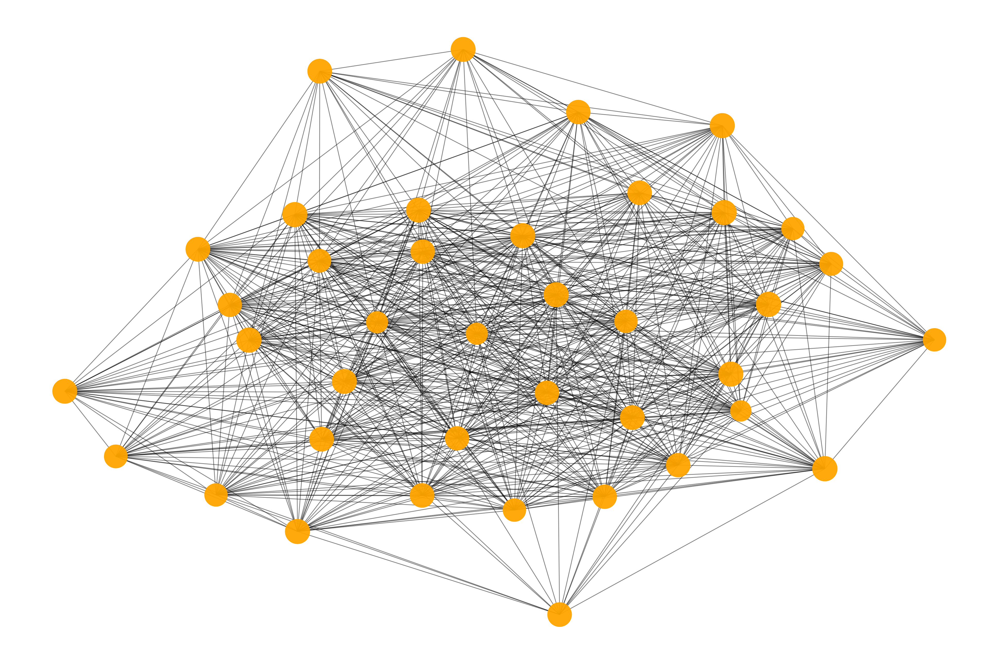

In [181]:

plotG_centrality(plantas_proyectadas,2, 'centralidad_plantas')


número de nodos: 93


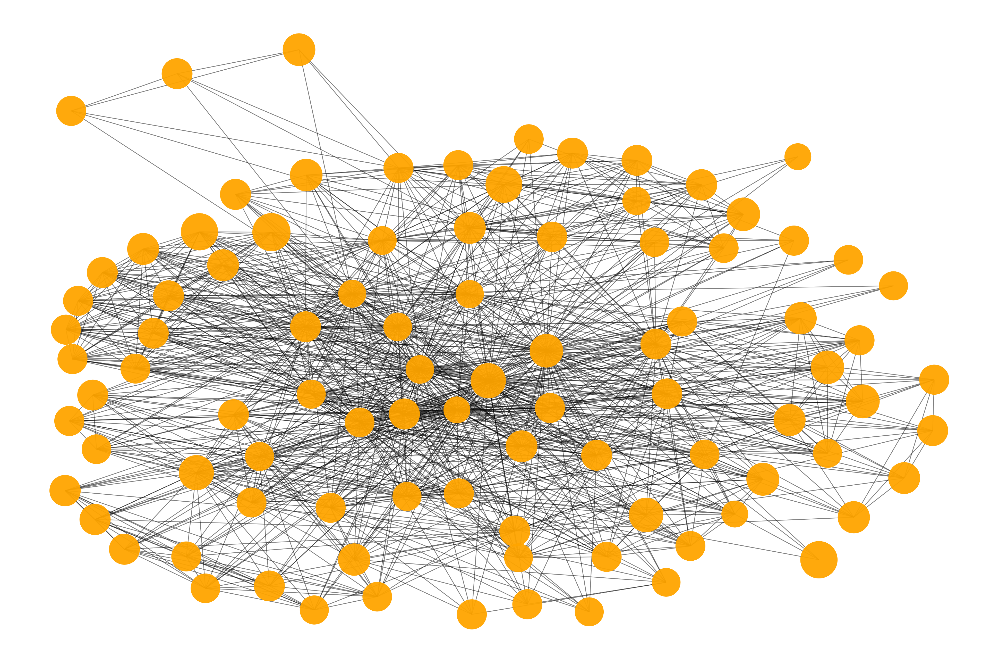

In [182]:
plotG_centrality(servicios_proyectados, 2, 'centralidad_servicios')

## Demostración  (3.b)

Consideremos un grafo k-regular no dirigido $A$, representado por su matriz de adyacencia:
\begin{equation}
A = \begin{bmatrix}
 & a_{11} & a_{12} & ..... & a_{1n} \\
 & a_{21} & a_{22} & ..... & a_{2n} \\ 
 & . & . \\
 & . & & . \\
 & . & & &\\
 & a_{n1} & a_{n2} & ..... & a_{nn} 
\end{bmatrix}
\end{equation}

Considerando que es un grafo k-regular, se debe cumplir la siguiente igualdad:
\begin{equation}
\sum_{i=1}^{n} a_{ji} = k
\end{equation}
con

    j: número del nodo, o fila de la matriz
    i: número de la columna
    n: número de nodos en el grafo
es decir, cada nodo debe tener la misma cantidad de vecinos.


Buscamos demostrar que el vector $x = \{1,1,1,...,1\}$ es un vector propio de la matriz $A$ con valor propio $\lambda$. 

En otras palabras, buscamos comprobar la igualdad:
\begin{equation}
Ax = \lambda x
\end{equation}

Reemplazando los valores de $A$, $\lambda$ y $x$, tenemos: 

\begin{equation}
\begin{bmatrix}
 & a_{11} & a_{12} & ..... & a_{1n} \\
 & a_{21} & a_{22} & ..... & a_{2n} \\ 
 & . & \\
 & . & . &  \\
 & . & &.\\
 & a_{n1} & a_{n2} & ..... & a_{nn} 
\end{bmatrix} 
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix}
= k
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix}
\end{equation}


resolviendo $Ax$:
\begin{equation}
\begin{bmatrix}
\sum_{i=1}^{n}a_{1i}\\
\sum_{i=1}^{n}a_{2i}\\
.\\
.\\
.\\
\sum_{i=1}^{n}a_{ni}\\
\end{bmatrix} 
= k
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix}
\end{equation}

Pero, debido a que el grafo es k-regular, se debe cumplir la igualdad $\sum_{i=1}^{n} a_{ji} = k$. por lo tanto al reemplazar en nuestra ecuación nos queda:



\begin{equation}
\begin{bmatrix}
    k\\
    k\\
    .\\
    .\\
    .\\
    k\\
\end{bmatrix}
= k 
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix}
\end{equation}


Factorizando el lado izquierdo por $k$:



\begin{equation}
k 
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix} 
=
k 
\begin{bmatrix}
1\\
1\\
.\\
.\\
.\\
1\\
\end{bmatrix} 
\end{equation}

Por lo que se cumple la igualdad, lo cual demuestra que el vector $\{1,1,1,...,1\}$ es un vector propio de $A$.

